# Crear la base de conocimiento del sistema experto para el diagnóstico de las migrañas.
Se trata de crear una base de conocimiento que nos permita obtener el diagnósito de un episodio de migraña.  
Para ello se va a utilizar la base de datos (dataset) en formato xls (Excel) facilitada en el siguiente artículo académico:  
***Analysis of Trigger Factors in Episodic Migraineurs Using a Smartphone Headache Diary Applications*** <a id="ref_1"/>*[[1](Park et al., 2016)](#ref1)*  
En dicho artículo se analizaba los episodios de migraña durante 3 meses de 62 pacientes con dicha enfermedad de los cuales 60 padecían habitualmente migrañas sin aura y los 2 restantes migrañas con aura.  
Para conocer más en profuncidad como clasificar a pacientes con migrañas con y sin aura podemos consultar el artículo:  
***Episodic Migraine With and Without Aura: Key Differences and Implications for Pathophysiology, Management, and Assessing Risks*** <a id="ref_2"/>*[[2](Vgontzas & Burch, 2018)](#ref2)*  
En el mismo se detalla el clasificador ***ICHD-3 The International Classification of Headache Disorders 3rd Edition*** <a id="ref_3"/>*[[3]Gobel, H. (s. f.)](#ref3)* como base para obtener método de clasificación de las migrañas sin aura bastante preciso.

## 0. Preprocesado de los datos para crear la base de conocimiento. 
La base de datos facilitada en el artículo *[[1](Park et al., 2016)](#ref1)* consta de 3 tablas:
* ***62patiens.*** Es la tabla resumen donde se describen los 62 pacientes con algún tipo de migraña. Además de una descripción física (edad, sexo, peso, etc) de los pacientes se detallan los tipos de desencadenantes (*triggers*) que han sido registrados en las tablas diario.
* ***headache diary 1099.*** Es la tabla diario donde solamente se incluyen los registros con algún tipo de dolor de cabeza sea debido a una migraña o no.
* ***total diary 4579.*** Es la tabla diario total donde se encuentran todos los registros, es decir, días de dolor de cabeza y sin dolor de cabeza registrando los desencadenantes más habituales que es la que ha utilizado como base de conocimiento del sistema experto ya que contiene un amplio registro de varios meses de los pacientes con registros positivos y negativos de algún tipo de cefalea, entre ellas las migrañas. En la Figura 1 se expone de manera visual y comprensible la distribución de cefaleas obtenidas de la base de datos.  

**Figura 1**. *Diagrama de flujo del diario completo de registros de pacientes con migrañas.*  
<img src="./DMS_imgs/Flow-Chart-Depicting-Subject-Participation-and-the-Number-of-Records.svg?sanitize=true" alt="Figura 1" style="zoom:100%;" />
Fuente: Adaptado de *[[1](Park et al., 2016)](#ref1)*

### 0.1 Obtener el *dataset* con los disparadores *(triggers)* a partir de la tabla *total diary 4579*.
De la tabla original ***total diary 4579***:  
<img src="./DMS_imgs/Dataset4579DiaryRecords.xlsx-Google-Sheets.svg" alt="Figura 1" style="zoom:125%;" />
Se extraen los disparadores más habituales como causantes de migrañas como son el ***estrés, sueño, ejercicio, fatiga, hormonales, emocionales, tiempo, luz, ruido, olores, comidas irregulares, cafeína, alcohol, comer chocolate/queso:***   
***TODO*** Usar <a id="ref_4"/>*[[4](Marmura, 2018)](#ref4)*, *[[1](Park et al., 2016)](#ref1)* y <a id="ref_5"/>*[[5](Kelman, 2007)](#ref5)* para explicar más en detalle los desencadenantes.  
La tabla de trabajo obtenida contiene los desencadenantes *(triggers)* como variables independientes ***X*** de entrada, con valores *1* como disparador activo y *0* como disparador que no se ha producido, la columna ***migraine*** corresponde a la salida o variable dependiente ***y***, donde *1* corresponde a un suceso de migraña (en total hay en esta base de datos 336 casos positivos *[[1](Park et al., 2016)](#ref1)*) de los 4578 originales, ya que se ha eliminado un registro por falta de datos válidos de la tabla original.  
La tabla obtenida y que se utiliza para los modelos de aprendizaje automático es la siguiente:
<img src="./DMS_imgs/S1_File_Preprocesed.xlsx-totalDiary4578Filtered.svg" alt="Figura 1" style="zoom:100%;" />  
Finalmente se exporta el tabla en excel a un formato fácil de utilizar con los diferentes algoritmos para construir el modelo de aprendizaje, en este caso el formato elegido es *csv (comma-separated values)*. Para ello se ha utilizado el Google Sheets (*File->Download->Comma-Separated Values*) obtenidendo el fichero ***'totalDiary4578Filtered.csv'***

## 1  Construir los modelos de aprendizaje.  
Primero se importan las librerías necesarias para crear los modelos.
* <a id="ref_6"/>*[[6] Pandas (Jeff Reback et al., 2021)](#ref6)* Pandas is an open source, BSD-licensed library providing high-performance, easy-to-use data structures and data analysis tools for the Python programming language.
* <a id="ref_7"/>*[[7] Numpy (Harris et al., 2020)](#ref7)* NumPy is an open source project aiming to enable numerical computing with Python.  
* <a id="ref_8"/>*[[8] Matplotlib (Thomas A Caswell et al., 2020)](#ref8)* Matplotlib is a comprehensive library for creating static, animated, and interactive visualizations in Python.  
* <a id="ref_9"/>*[[9] Scikit-learn (Pedregosa et al., 2011)](#ref9)* Scikit-learn is a Python module integrating a wide range of state-of-the-art machine learning algorithms for medium-scale supervised and unsupervised problems.   

Además se definen las funciones necesarias para obtener el umbral óptimo, así como para las visualizaciones de las matrices de confusión...

In [150]:
# Magic function '%config InlineBackend.figure_format' Improve quality of graphic outputs 
%config InlineBackend.figure_format = 'svg' 

###########
# IMPORTS #
###########
# Data analysis
import pandas as pd
# 2D graphics environment
import matplotlib.pyplot as plt
# Pretty printing of dataframe
from IPython.core.display import HTML, display
# NumPy enable numerical computing with Python
import numpy as np
# Import seaborn for stadistical graphics
import seaborn as sns
# Import module for data visualization
from plotnine import *
import plotnine


#######################
# SPECIFIC FUNCTIONS  #
#######################
#################################################################################################
# Printing an elegant confusion matrix 
# Author: T, D. (2019, julio 25). Confusion Matrix Visualization. 
#         Medium. https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
#################################################################################################
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    ---------
    cf:            confusion matrix to be passed in
    group_names:   List of strings that represent the labels row by row to be shown in each square.
    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'
    count:         If True, show the raw number in the confusion matrix. Default is True.
    normalize:     If True, show the proportions for each category. Default is True.
    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.
    xyticks:       If True, show x and y ticks. Default is True.
    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.
    sum_stats:     If True, display summary statistics below the figure. Default is True.
    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.
    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.
    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels, group_counts, group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0], cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

### 1.1 Importando el dataset.  
#### 1.1.1 Carga del dataset .  
Carga en un dataframe con las columnas que van a ser utilizadas en la creación de los modelos eliminando las columnas que no van a ser utilizadas.

In [151]:
attributes_selected = ['gender', 'age',
                       'ICHD_3_B_duration_criteria', 'ICHD_3_C_1_pain_area_unilateral',
                       'ICHD_3_C_2_pain_shape_pulsatile', 'ICHD_3_C_3_pain_intensity', 
                       'ICHD_3_C_4_pain_in_movement', 'ICHD_3_D_1_symptoms_nausea_vomiting',
                       'ICHD_3_D_2_symptoms_photo_phono_phobia', 'trigger_stress', 'trigger_excessive_sleep',
                       'trigger_lack_sleep', 'trigger_exercise', 'trigger_not_exercise', 'trigger_fatigue',
                       'trigger_hormonal_changes', 'trigger_emotional_changes', 'trigger_weather_changes',
                       'trigger_excessive_sunlight', 'trigger_inappropriate_lighting', 'trigger_noise',
                       'trigger_smells', 'trigger_irregular_eating', 'trigger_overeating', 'trigger_caffeine',
                       'trigger_smoking', 'trigger_drinking_alcohol','trigger_chocolate_cheese', 'trigger_traveling',
                       'trigger_other', 'ICHD_3_migraine', 'ICHD_3_probable_migraine', 'ICHD_3_no_migraine',
                       'ICHD_3_migraine_classes']


# Read the dataset in format comma-separated values (csv) into a dataframe
dframe = pd.read_csv('./DMS_datasets/totalDiary4578Filtered.csv', skipinitialspace=True, usecols=attributes_selected)

# Removing uninteresting headers first
dframe = dframe.drop(columns=['gender', 'age', 'trigger_other'])

# Display the dataframe loaded
display(dframe)

,ICHD_3_C_4_pain_in_movement,ICHD_3_C_3_pain_intensity,ICHD_3_C_1_pain_area_unilateral,ICHD_3_C_2_pain_shape_pulsatile,ICHD_3_D_1_symptoms_nausea_vomiting,ICHD_3_D_2_symptoms_photo_phono_phobia,ICHD_3_B_duration_criteria,trigger_stress,trigger_excessive_sleep,trigger_lack_sleep,...,trigger_overeating,trigger_caffeine,trigger_smoking,trigger_drinking_alcohol,trigger_chocolate_cheese,trigger_traveling,ICHD_3_migraine,ICHD_3_probable_migraine,ICHD_3_no_migraine,ICHD_3_migraine_classes
0,1,1,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,1
1,0,1,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,1
2,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,1,1,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,1
4,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4573,1,1,0,0,1,0,1,0,0,1,...,0,0,0,0,0,0,1,0,0,2
4574,0,0,0,1,0,0,1,0,0,0,...,1,0,0,0,0,1,0,0,1,0
4575,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
4576,1,1,0,1,1,0,1,0,0,1,...,0,0,0,0,1,0,1,0,0,2


## 1.2 Gráfico de correlación entre características  
Este gráfico intuitivo permite de una manera visual y rápida qué características están más relacionadas entre sí y por lo tanto tienen mayor importancia en la obtención del modelo predictivo.

<AxesSubplot:>

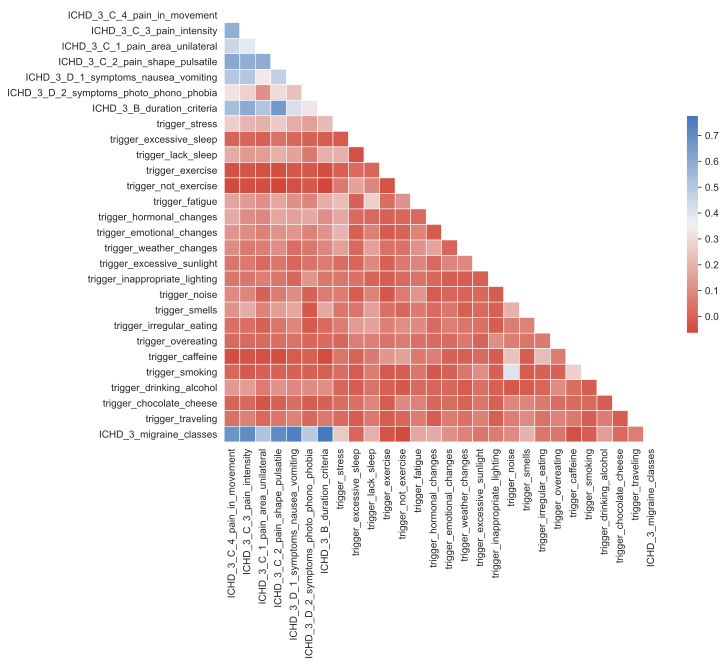

In [152]:
# use the pands .corr() function to compute pairwise correlations for the dataframe
corr = dframe.drop(columns=['ICHD_3_migraine', 'ICHD_3_probable_migraine', 'ICHD_3_no_migraine']).corr()
# visualise the data with seaborn
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.set_style(style = 'white')
f, ax = plt.subplots(figsize=(10, 8))
cmap = sns.diverging_palette(15, 250, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, 
        square=True,
        linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)


## 1.3 Clasificar las variables dependientes (*classes*) y la independientes (*features*) .  
Creando el *dataframe* con las características de entrada ***X*** y el de las clases buscadas ***Y (ICHD_3_migraine, ICHD_3_probable_migraine, ICHD_3_no_migraine)*** las cuales han sido agrupadas en la columna ***ICHD_3_migraine_classes*** que puede tener 3 valores:
* 2 para ***ICHD_3_migraine*** 
* 1 para ***ICHD_3_probable_migraine***  
* 0 para ***ICHD_3_no_migraine***  

In [153]:
# Splitting dataset into classes and features
# y['ICHD_3_migraine_classes'] -> (2, ICHD_3_migraine) (1, ICHD_3_probable_migraine) and (0, ICHD_3_no_migraine)
y = dframe.filter(['ICHD_3_migraine_classes']) 
# features are all columns except classes
X = dframe.iloc[ : ,  :(len(dframe.columns) - 4)]
# Remove ICHD features
XOnlyTriggers = dframe.drop(columns=['ICHD_3_B_duration_criteria', 'ICHD_3_C_1_pain_area_unilateral', 
                                     'ICHD_3_C_2_pain_shape_pulsatile', 'ICHD_3_C_3_pain_intensity',
                                     'ICHD_3_C_4_pain_in_movement','ICHD_3_D_1_symptoms_nausea_vomiting',
                                     'ICHD_3_D_2_symptoms_photo_phono_phobia','ICHD_3_migraine', 
                                     'ICHD_3_probable_migraine', 'ICHD_3_no_migraine','ICHD_3_migraine_classes'])
XOnlyICHD = dframe[['ICHD_3_B_duration_criteria', 'ICHD_3_C_1_pain_area_unilateral', 
                                     'ICHD_3_C_2_pain_shape_pulsatile', 'ICHD_3_C_3_pain_intensity',
                                     'ICHD_3_C_4_pain_in_movement','ICHD_3_D_1_symptoms_nausea_vomiting',
                                     'ICHD_3_D_2_symptoms_photo_phono_phobia']]
XMainTriggers = dframe[['ICHD_3_B_duration_criteria', 'ICHD_3_C_1_pain_area_unilateral', 
                                     'ICHD_3_C_2_pain_shape_pulsatile', 'ICHD_3_C_3_pain_intensity',
                                     'ICHD_3_C_4_pain_in_movement','ICHD_3_D_1_symptoms_nausea_vomiting',
                                     'ICHD_3_D_2_symptoms_photo_phono_phobia','trigger_stress',
                                     'trigger_hormonal_changes', 'trigger_lack_sleep','trigger_fatigue',
                                     'trigger_drinking_alcohol' , 'trigger_weather_changes']]

# Display multiclass y, when 0 = no_migraine, 1 = probable_migraine and 2 = migraine
display(y)
display(X)
#display(XOnlyTriggers)
#display(XOnlyICHD)

,ICHD_3_migraine_classes
0,1
1,1
2,0
3,1
4,0
...,...
4573,2
4574,0
4575,0
4576,2


,ICHD_3_C_4_pain_in_movement,ICHD_3_C_3_pain_intensity,ICHD_3_C_1_pain_area_unilateral,ICHD_3_C_2_pain_shape_pulsatile,ICHD_3_D_1_symptoms_nausea_vomiting,ICHD_3_D_2_symptoms_photo_phono_phobia,ICHD_3_B_duration_criteria,trigger_stress,trigger_excessive_sleep,trigger_lack_sleep,...,trigger_inappropriate_lighting,trigger_noise,trigger_smells,trigger_irregular_eating,trigger_overeating,trigger_caffeine,trigger_smoking,trigger_drinking_alcohol,trigger_chocolate_cheese,trigger_traveling
0,1,1,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,1,1,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4573,1,1,0,0,1,0,1,0,0,1,...,0,1,1,1,0,0,0,0,0,0
4574,0,0,0,1,0,0,1,0,0,0,...,0,1,1,1,1,0,0,0,0,1
4575,0,0,0,0,0,0,0,1,0,1,...,0,0,1,1,0,0,0,0,0,0
4576,1,1,0,1,1,0,1,0,0,1,...,0,1,1,1,0,0,0,0,1,0


## 1.4 *Dataset* desbalanceado.  
En este caso la el objetivo buscado es predecir las clases ***Migraine*** o ***Probable migraine***, las cuales corresponden a las clases minoritarias de un dataset desbalanceado con un ratio del ***5.8%*** y del ***8.8%*** respectivamente frente al ***85.4%*** de la clase mayoritaria ***No migraine*** ... como se puede observar en la siguiente imagen:

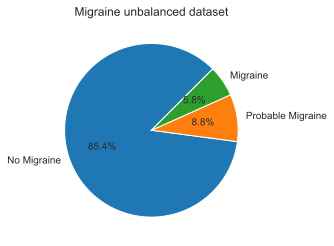

In [154]:
migraine_count = np.count_nonzero(dframe['ICHD_3_migraine'].to_numpy())
probable_migraine_count = np.count_nonzero(dframe['ICHD_3_probable_migraine'].to_numpy())
no_migraine_count = dframe['ICHD_3_migraine'].count() - migraine_count - probable_migraine_count
Migraines = [no_migraine_count, probable_migraine_count, migraine_count]
stringLabels = ['No Migraine','Probable Migraine', 'Migraine']
plt.pie(Migraines, labels=stringLabels, startangle=45, autopct='%.1f%%')
plt.title('Migraine unbalanced dataset')
plt.show()
#display(Migraines)

# 2 Utilizando el modelo *multinominal logistic regression*.  
Este modelo de aprendizaje es conveniente cuando se dispone de muchas variables independientes de entrada con valores binarios (0/1) y varias variables dependientes de salida.  
La regresión logística ***multinominal*** es una extensión de la regresión logística binaria que permite más de dos categorías de la variable dependiente como es el caso de este *dataset* en el que tenemos 3.  
Al igual que la regresión logística binaria, la regresión logística multinomial utiliza la estimación de máxima verosimilitud para evaluar la ***probabilidad*** de pertenencia categórica.  
## 2.0 Métricas utilizadas para evaluar el rendimiento del modelo.  
Las métricas utilizadas para evaluar el rendimiento del modelo son:
* ***precision_score*** es la relación *tpositive / (tpositive + fpositive)*, es decir, la habilidad del clasificador de no clasificar como positivo una muestra que en realidad es negativa. Es una media útil cuando el coste debido a los **falsos positivos** es elevado.  
* ***recall_score*** es la relación *tpositive / (tpositive + fnegative)*, es decir, la habilidad del clasificador de encontrar todas la muestras positivas. Es importante cuando el coste de los **falsos negativos** es elevado. 
* ***f1_score*** es el media armónica de las 2 métricas anteriores ***precision*** y ***recall***, tal que *f1 = 2 * (precision * recall) / (precision + recall)*. El ***F1 score*** para *datasets* desbalanceados como este es una media conveniente ya que penaliza los valores extremos, es decir, puede haber un valor elevado de ***precision*** pero si el valor de ***recall*** es valor de ***f1*** será muy bajo y viceversa.
* ***accuracy_score*** es la relación *(tpositive + tnegative) / (tpositive + fpositive + tnegative + fnegative)* que calcula la exactitud del modelo, es decir, el porcentaje de las clases que han sido predecidas correctamente respecto al total de las predicciones, sean correctas o no. 

**Nota:** En todas las métricas anteriores, el valor idóneo es 1 y el más negativo es 0 y han sido extraídas utilizando la librería <a id="ref_9"/>*[[9] Scikit-learn (Pedregosa et al., 2011)](#ref9)*.

## 2.1 Todos los datos como datos de entrenamiento (Primer planteamiento).  
Utilizando todos los datos como datos de entrenamiento, como se muestra a continuación:

Metric score format:  [NMig%  PMig%   Mig%]
Precision score:      [99.95% 98.99% 96.70%]
Recall score:         [99.92% 97.27% 99.62%]
F1 score:             [99.94% 98.12% 98.14%]
Accuracy:             99.67%


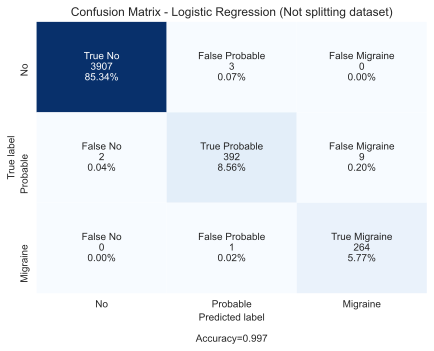

In [175]:
# Scikit-learn, integrating the logistic regression algorithm
from sklearn.linear_model import LogisticRegression
# Metrics
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, recall_score, precision_score
##################################################
# Multinomial logistic regression model instance
##################################################
# In this case, the 'random_state' passed value will have an effect on the reproducibility of the results 
# returned by the function (fit, split, or any other function like k_means)
# ‘lbfgs’ solver support only L2 regularization 
# ‘multinomial’ uses the cross-entropy loss for multiclass
LRegression_Multi_Model = LogisticRegression(multi_class='multinomial', solver='lbfgs', random_state = 0)
# fit the model first, and 
# predict the output classes 'migraine', 'probable_migraine' and 'no_migraine' for samples in X
y_predict_all_data = LRegression_Multi_Model.fit(X.values, y.values.ravel()).predict(X)

# Metrics with all data
precision_score_all_data = precision_score(y, y_predict_all_data, average=None)
recall_score_all_data = recall_score(y, y_predict_all_data, average=None)
f1_score_all_data = f1_score(y, y_predict_all_data, average=None)


print("Metric score format:  [NMig%  PMig%   Mig%]")

# precision_score
print("Precision score:      [{0:2.2%} {1:2.2%} {2:2.2%}]".format(precision_score_all_data[0],
                                                             precision_score_all_data[1],
                                                             precision_score_all_data[2]))
# recall_score
print("Recall score:         [{0:2.2%} {1:2.2%} {2:2.2%}]".format(recall_score_all_data[0],
                                                             recall_score_all_data[1],
                                                             recall_score_all_data[2]))
# balanced F-score
print("F1 score:             [{0:2.2%} {1:2.2%} {2:2.2%}]".format(f1_score_all_data[0],
                                                             f1_score_all_data[1],
                                                             f1_score_all_data[2]))
# accuracy  score
print("Accuracy:             {:2.2%}".format(accuracy_score(y, y_predict_all_data)))
# confusion matrix
#print("Confusion Matrix: \r\n", confusion_matrix(y, y_predict_all_data))
labels = ['True No','False Probable','False Migraine','False No', 'True Probable',
         'False Migraine', 'False No','False Probable','True Migraine']
categories = ['No', 'Probable','Migraine']
make_confusion_matrix(confusion_matrix(y, y_predict_all_data), group_names=labels, categories=categories,
                      title='Confusion Matrix - Logistic Regression (Not splitting dataset)', 
                      cbar=False, figsize=(7,5))

## 2.2 Dividir los datos en datos de prueba y de entrenamiento.  

Utilizando todos los datos disponibles como datos de entrenamiento se obtiene una precisión del ***99.67%***, una buena precisión, pero hay que descartar que sea una medida engañosa ya que pueden ocurrir alguna de las siguientes situaciones:  
- Que utilizando todos los datos como datos de entrenamiento se corre el riesgo bastante probable de tener ***overfitting***, es decir, que el modelo se ajuste perfectamente a los datos de entrenamiento pero cuando se utilizan nuevos datos de prueba no se ajuste correctamente.  
- Que en un *dataset* desequilibrado <u>como es el caso</u>, el modelo de aprendizaje corre el riesgo de predecir sobre todo la clase mayoritaria, en este caso concreto, la clase mayoritaría corresponde a los días con ausencia de migraña. Por lo tanto, hay que descartar que el modelo obtenido aplicando el clasificador de regresión logística <u>no sea adecuado</u>, y una forma inmediata de hacerlo, es dividir los datos en datos de prueba y datos de entrenamiento.
Cuando todos los datos procedentes del dataset se usan como datos de entrenamiento, como en el apartado anterior, se puede obtener una precisión en el modelo muy elevada ***99,67%*** que puede ser engañosa debido a un sobreajuste ***overfitting*** que provoque que el modelo siga a la perfeción o casi todas las muestras de entrenamiento, y sin embargo, no se ajuste bien a nuevos datos (predicciones) que es lo que se busca obtener. 

### 2.2.1 División de los datos en una parte, (20%) de prueba y el resto (80%) de entrenamiento.
Un punto de partida para comprobar si estamos con un problema de sobreajuste o no, es dividir el dataset dos partes, una de prueba y otra de entrenamiento:
* <ins>*Datos de prueba*</ins>, es decir, datos nuevos, para ver si el modelo se ajusta correctamente, un porcentaje de un 20% suele ser una elección habitual.
* El resto como <ins>*datos de entrenamiento*</ins> del modelo, en este caso el 80%.


Metric score format:      [NMig%  PMig%   Mig%]
Precision score - 80|20:  [99.87% 97.50% 96.23%]
Recall score - 80|20:     [100.00% 96.30% 96.23%]
F1 score - 80|20:         [99.94% 96.89% 96.23%]
Accuracy - 80|20:         [99.45%]


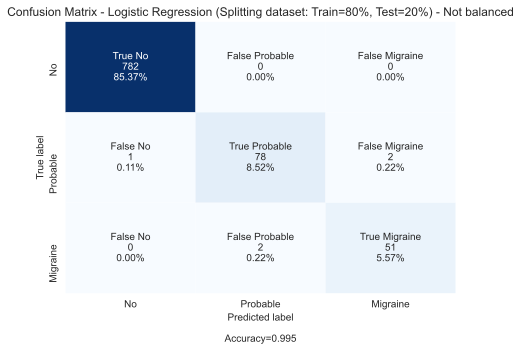

In [176]:
# Scikit-learn, split arrays or matrices into random train and test subsets
from sklearn.model_selection import train_test_split
# Scikit-learn, K-Folds cross-validator
# Provides train/test indices to split data in train/test sets. 
# Split dataset into k consecutive folds (without shuffling by default).
# Each fold is then used once as a validation while the k - 1 remaining folds form the training set.
from sklearn.model_selection import KFold
# Evaluate a score by cross-validation
from sklearn.model_selection import cross_val_score
# Accuracy classification score.
from sklearn.metrics import accuracy_score
# Compute confusion matrix to evaluate the accuracy of a classification
from sklearn.metrics import confusion_matrix
# Compute the F1 score, also known as balanced F-score or F-measure
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report


# spliting 20% (test data), 80% (training data) and stratify mode:
# https://scikit-learn.org/stable/modules/cross_validation.html#stratification
# with 'random_state=0' everytime the result will be the same
XTrain, XTest, yTrain, yTest = train_test_split(X.values, y.values.ravel(), test_size = 0.2,
                                                stratify=y, random_state=0)

# Fit the model according to the given training data
# Note: .ravel() will convert 'y' array shape to (n, ) to avoid the warning:
#       "DataConversionWarning: A column-vector y was passed when a 1d array was expected. 
#        Please change the shape of y to (n_samples, ), for example using ravel()."
y_predict_80_20  = LRegression_Multi_Model.fit(XTrain, yTrain.ravel()).predict(XTest)

# Metrics with 80/20 (Train/Test) split size
precision_score_80_20 = precision_score(yTest, y_predict_80_20, average=None)
recall_score_80_20 = recall_score(yTest, y_predict_80_20, average=None)
f1_score_80_20 = f1_score(yTest, y_predict_80_20, average=None)

print("Metric score format:      [NMig%  PMig%   Mig%]")
# precision_score
print("Precision score - 80|20:  [{0:2.2%} {1:2.2%} {2:2.2%}]".format(precision_score_80_20[0],
                                                                      precision_score_80_20[1],
                                                                      precision_score_80_20[2]))
# recall_score
print("Recall score - 80|20:     [{0:2.2%} {1:2.2%} {2:2.2%}]".format(recall_score_80_20[0],
                                                                     recall_score_80_20[1],
                                                                     recall_score_80_20[2]))
# balanced F-score
print("F1 score - 80|20:         [{0:2.2%} {1:2.2%} {2:2.2%}]".format(f1_score_80_20[0],
                                                                     f1_score_80_20[1],
                                                                     f1_score_80_20[2]))
# accuracy  score
print("Accuracy - 80|20:         [{:2.2%}]".format( accuracy_score(yTest, y_predict_80_20)))


# confusion matrix
labels = ['True No','False Probable','False Migraine','False No', 'True Probable',
         'False Migraine', 'False No','False Probable','True Migraine']
categories = ['No', 'Probable','Migraine']
make_confusion_matrix(confusion_matrix(yTest, y_predict_80_20), group_names=labels, categories=categories,
                      title='Confusion Matrix - Logistic Regression (Splitting dataset: Train=80%, Test=20%) - '
                      +'Not balanced', 
                      cbar=False, figsize=(7,5))


Las métricas obtenidas son los siguientes:


| Metric     |  No Migraine | Probable Migraine | Migraine  |
| :-         | :-           | :-                | :-        |
| Precision  | 99.87%        | 95.5%             | 96.23%     |
| Recall     | 100%         | 96.3%             | 96.23%      |
| F1         | 99.94%        | 96.89%             | 96.23%     |
|            | Default Umbral    |Default Umbral          |Default Umbral  |
|            | **0.5**    |**0.5**          |**0.5**     |

**CONCLUSIÓN:** El modelo parece bastante adecuado apenas han descendido los valores de la métricas teniendo en cuenta que normal que desciendan ya que el modelo se ha calculado con menos muestras (80%).  
<u>Aún así</u>, es conveniente particionar el modelo en distintos bloques de entrenamiento y de test distribuidos a lo largo de dataset para verificar que el modelo es adecuado, utilizando la función ***Stratified K-fold*** de la librería <a id="ref_9"/>*[[9] Scikit-learn (Pedregosa et al., 2011)](#ref9)*
### 2.2.2 Aplicar una validación cruzada *Stratified K-fold Cross-Validation* 
Las métricas obtendidas aplicando regresión logistica como se hace en el apartado anterior, son bastante buenas, pero es conveniente verificar los resultados haciendo una validación cruzada para comprobar que los resultados son buenos dividiendo los datos de test y de entrenamiento a lo largo de todo el *dataset* (*8 splits*) obteniendo las métricas en promedio para cada uno de los bloques de datos ***'stratified folds'***.

In [198]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold


# Variables for metrics average values
prec_avg_no_migraine = 0
prec_avg_possible_migraine = 0
prec_avg_migraine = 0
f1_avg_no_migraine = 0
f1_avg_possible_migraine = 0
f1_avg_migraine = 0
recall_avg_no_migraine = 0
recall_avg_possible_migraine = 0
recall_avg_migraine = 0
accuracy_avg = 0

number_splits = 8

# Provides train/test indices to split data in train/test sets, num splits = 8
#kf = KFold(n_splits=number_splits, shuffle=True, random_state = 0) 
# StratifiedKFold object is a variation of KFold that returns stratified folds. 
# The folds are made by preserving the percentage of samples for each class.
skf = StratifiedKFold(n_splits=number_splits, shuffle=True, random_state = 0)
skf.get_n_splits(X, y)

#for train_index, test_index in kf.split(X):
for train_index, test_index in skf.split(X,y):
    XTrain, XTest = X.iloc[train_index], X.iloc[test_index]
    yTrain, yTest = y.iloc[train_index], y.iloc[test_index]
    yMigrainePredictKFold = LRegression_Multi_Model.fit(XTrain, yTrain.values.ravel()).predict(XTest)
    # precision_score
    var_precision_score =  precision_score(yTest, yMigrainePredictKFold, average=None)
    prec_avg_no_migraine = prec_avg_no_migraine + var_precision_score[0]
    prec_avg_possible_migraine = prec_avg_possible_migraine + var_precision_score[1]
    prec_avg_migraine = prec_avg_migraine + var_precision_score[2]
    #print("Precision score: " , var_precision_score)
        
    # F-score
    var_f1_score =  f1_score(yTest, yMigrainePredictKFold, average=None)
    f1_avg_no_migraine = f1_avg_no_migraine + var_f1_score[0]
    f1_avg_possible_migraine = f1_avg_possible_migraine + var_f1_score[1]
    f1_avg_migraine = f1_avg_migraine + var_f1_score[2]
    #print("F1 score: " , var_f1_score)
        
    # recall_score
    var_recall_score =  recall_score(yTest, yMigrainePredictKFold, average=None)
    recall_avg_no_migraine = recall_avg_no_migraine + var_recall_score[0]
    recall_avg_possible_migraine = recall_avg_possible_migraine + var_recall_score[1]
    recall_avg_migraine = recall_avg_migraine + var_recall_score[2]
    #print("Recall score: " , var_recall_score)
        
    # accuracy_score
    var_accuracy_score = accuracy_score(yTest, yMigrainePredictKFold)
    accuracy_avg = accuracy_avg + var_accuracy_score
    #print("Accuracy score: " , var_accuracy_score)
        
# precision metric average   
prec_avg_no_migraine = prec_avg_no_migraine / number_splits
prec_avg_possible_migraine = prec_avg_possible_migraine / number_splits
prec_avg_migraine = prec_avg_migraine / number_splits

# recall metric average   
recall_avg_no_migraine = recall_avg_no_migraine / number_splits
recall_avg_possible_migraine = recall_avg_possible_migraine / number_splits
recall_avg_migraine = recall_avg_migraine / number_splits
   
# f1 metric average   
f1_avg_no_migraine = f1_avg_no_migraine / number_splits
f1_avg_possible_migraine = f1_avg_possible_migraine / number_splits
f1_avg_migraine = f1_avg_migraine / number_splits

# accuracy metric average
accuracy_avg = accuracy_avg / number_splits

print("Metric score format:                        [NMig% PMig% Mig%]")

# precision_score
print("Precision score average - {0} Splits - Kfold: [{1:2.1%} {2:2.1%} {3:2.1%}]".format(number_splits, 
                                                               round(prec_avg_no_migraine,3), 
                                                               round(prec_avg_possible_migraine,3), 
                                                               round(prec_avg_migraine,3)))
# recall_score
print("Recall score average - {0} Splits - Kfold:    [{1:2.1%} {2:2.1%} {3:2.1%}]".format(number_splits, 
                                                               round(recall_avg_no_migraine,3), 
                                                               round(recall_avg_possible_migraine,3), 
                                                               round(recall_avg_migraine,3)))
# F1 score
print("F1 score average - {0} Splits - Kfold:        [{1:2.1%} {2:2.1%} {3:2.1%}]".format(number_splits, 
                                                               round(f1_avg_no_migraine,3), 
                                                               round(f1_avg_possible_migraine,3), 
                                                               round(f1_avg_migraine,3)))

# Accuracy score
print("Accuracy score average - {0} Splits - Kfold:  [{1:2.1%}]".format(number_splits, 
                                                               round(accuracy_avg,3)))


Metric score format:                        [NMig% PMig% Mig%]
Precision score average - 8 Splits - Kfold: [99.8% 94.5% 96.0%]
Recall score average - 8 Splits - Kfold:    [99.6% 95.8% 96.6%]
F1 score average - 8 Splits - Kfold:        [99.7% 95.1% 96.2%]
Accuracy score average - 8 Splits - Kfold:  [99.1%]


**CONCLUSIÓN:** Utilizado una validación cruzada y distribuida en 8 partes se concluye que no hay ***overfitting*** aparente y el modelo es bastante bueno utilizado la regresión logística con los parámetros utilizados.  
No obstante, se puede intentar mejorar el modelo con algunos de los métodos disponibles.

## 2.4 Métodos para tratar de mejorar el modelo obtenido.  
### 2.4.1 Ajustar los pesos en función de la frecuencia de las clases "class_weight = 'balanced'".  

En la práctica, en el modelo de regresión logistica de la librería de ***sklearn*** el parámetro ***class_weight = 'balanced'*** puede ser conveniente para los ***datasets*** no balanceados ya que los pesos se ajustan inversamente proporcional a la frecuencia de las clases, lo cual puede resultar interesante cuando el *dataset* es no está balanceado, es decir la frecuencia de las clases es muy dispar como es el caso de este enel que la clase mayoritaria ***No migraine (85.4%)*** predomina sobre las clases minoritarías ***Migraine (5.8%)*** y ***Probable migraine (8.8%)***.

In [185]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

# Variables for metrics average values
prec_avg_no_migraine = 0
prec_avg_possible_migraine = 0
prec_avg_migraine = 0
f1_avg_no_migraine = 0
f1_avg_possible_migraine = 0
f1_avg_migraine = 0
recall_avg_no_migraine = 0
recall_avg_possible_migraine = 0
recall_avg_migraine = 0
accuracy_avg = 0

number_splits = 8


#############################################################
# Multinomial 'balanced' logistic regression model instance
#############################################################
# class_weight = 'balanced' (convenient for unbalanced dataset) ->  mode uses the values of y to automatically adjust
# weights inversely proportional to class frequencies in the input data as n_samples / (n_classes * np.bincount(y)).
LRegression_Multi_Model_Balanced = LogisticRegression(multi_class='multinomial', 
                                                     solver='lbfgs', 
                                                     random_state = 0, 
                                                     class_weight = 'balanced')

# Provides train/test indices to split data in train/test sets, num splits = 8
#kf = KFold(n_splits=number_splits, shuffle=True, random_state = 0) 
# StratifiedKFold object is a variation of KFold that returns stratified folds. 
# The folds are made by preserving the percentage of samples for each class.
skf = StratifiedKFold(n_splits=number_splits, shuffle=True, random_state = 0)
skf.get_n_splits(X, y)

#for train_index, test_index in kf.split(X):
for train_index, test_index in skf.split(X,y):
    XTrain, XTest = X.iloc[train_index], X.iloc[test_index]
    yTrain, yTest = y.iloc[train_index], y.iloc[test_index]
    yMigrainePredictKFoldBalanced = LRegression_Multi_Model_Balanced.fit(XTrain,yTrain.values.ravel() ).predict(XTest)
    # precision_score
    var_precision_score =  precision_score(yTest, yMigrainePredictKFoldBalanced, average=None)
    prec_avg_no_migraine = prec_avg_no_migraine + var_precision_score[0]
    prec_avg_possible_migraine = prec_avg_possible_migraine + var_precision_score[1]
    prec_avg_migraine = prec_avg_migraine + var_precision_score[2]
    #print("Precision score: " , var_precision_score)
        
    # F-score
    var_f1_score =  f1_score(yTest, yMigrainePredictKFoldBalanced, average=None)
    f1_avg_no_migraine = f1_avg_no_migraine + var_f1_score[0]
    f1_avg_possible_migraine = f1_avg_possible_migraine + var_f1_score[1]
    f1_avg_migraine = f1_avg_migraine + var_f1_score[2]
    #print("F1 score: " , var_f1_score)
        
    # recall_score
    var_recall_score =  recall_score(yTest, yMigrainePredictKFoldBalanced, average=None)
    recall_avg_no_migraine = recall_avg_no_migraine + var_recall_score[0]
    recall_avg_possible_migraine = recall_avg_possible_migraine + var_recall_score[1]
    recall_avg_migraine = recall_avg_migraine + var_recall_score[2]
    #print("Recall score: " , var_recall_score)
        
    # accuracy_score
    var_accuracy_score = accuracy_score(yTest, yMigrainePredictKFoldBalanced)
    accuracy_avg = accuracy_avg + var_accuracy_score
    #print("Accuracy score: " , var_accuracy_score)
        
# precision metric average   
prec_avg_no_migraine = prec_avg_no_migraine / number_splits
prec_avg_possible_migraine = prec_avg_possible_migraine / number_splits
prec_avg_migraine = prec_avg_migraine / number_splits

# recall metric average   
recall_avg_no_migraine = recall_avg_no_migraine / number_splits
recall_avg_possible_migraine = recall_avg_possible_migraine / number_splits
recall_avg_migraine = recall_avg_migraine / number_splits
   
# f1 metric average   
f1_avg_no_migraine = f1_avg_no_migraine / number_splits
f1_avg_possible_migraine = f1_avg_possible_migraine / number_splits
f1_avg_migraine = f1_avg_migraine / number_splits

# accuracy metric average
accuracy_avg = accuracy_avg / number_splits

print("Metric score format:                                   [NMig% PMig% Mig%]")

# precision_score
print("Precision score average (Balanced) - {0} Splits - Kfold: [{1:2.1%} {2:2.1%} {3:2.1%}]".format(number_splits, 
                                                               round(prec_avg_no_migraine,3), 
                                                               round(prec_avg_possible_migraine,3), 
                                                               round(prec_avg_migraine,3)))
# recall_score
print("Recall score average (Balanced) - {0} Splits - Kfold:    [{1:2.1%} {2:2.1%} {3:2.1%}]".format(number_splits, 
                                                               round(recall_avg_no_migraine,3), 
                                                               round(recall_avg_possible_migraine,3), 
                                                               round(recall_avg_migraine,3)))
# F1 score
print("F1 score average (Balanced) - {0} Splits - Kfold:        [{1:2.1%} {2:2.1%} {3:2.1%}]".format(number_splits, 
                                                               round(f1_avg_no_migraine,3), 
                                                               round(f1_avg_possible_migraine,3), 
                                                               round(f1_avg_migraine,3)))

# Accuracy score
print("Accuracy score average (Balanced) - {0} Splits - Kfold:  [{1:2.1%}]".format(number_splits, 
                                                               round(accuracy_avg,3)))



Metric score format:                                   [NMig% PMig% Mig%]
Precision score average (Balanced) - 8 Splits - Kfold: [100.0% 78.4% 96.4%]
Recall score average (Balanced) - 8 Splits - Kfold:    [97.2% 97.5% 99.6%]
F1 score average (Balanced) - 8 Splits - Kfold:        [98.6% 86.9% 98.0%]
Accuracy score average (Balanced) - 8 Splits - Kfold:  [97.4%]


Para este conjunto de datos, si bien ha mejorado la métrica ***F1*** de ***96.2%*** a ***98.0%*** para la clase minoritaria ***Migraine***, <ins>***sin embargo***</ins> se han producido más falsos positivos para la clase ***Probable migraine***, esto es debido a que el límite de decisión (***decision boundary***) entre la clase mayoritaria ***No migraine*** y la clase ***Probable migraine*** se ha visto desplazado en favor de la última en exceso, haciendo que en este caso la métrica ***F1*** descienda hasta ***86.9%*** lo cual no está muy mal pero era bastante mejor ***95.1%*** cuando no se había modificado el modelo con el parámetro ***class_weight***.

**CONCLUSIÓN: Modificación del parámetro "class_weight='balanced' -> <u>descartado</u>"**  

### 2.4.2 Ajuste del umbral óptimo del modelo  
Entre las soluciones que hay para mejorar el rendimiento del modelo obtenido en *datasets* desbalanceados como es el caso, existen varias aproximaciones o vías que se pueden intentar como quedan muy bien detalladas en los siguientes artículos <a id="ref_11"/>[[11] (Rocca, 2021)](#ref11) y <a id="ref_12"/>[[12] (Brownlee, 2020)](#ref12), entre ellas las siguientes relacionadas con modificaciones sobre los datos de partida:  
* Utilizar técnicas de submuestreo (***Undersampling***) de la clase predominante, en este caso es ***No migraines*** frente a las otras 2 que son minoritarias ***Probable Migraine*** y ***Migraine***. Consiste básicamente en eliminar muestras mayoritarias tratando de equilibrar la base de datos.  
* Utilizar técnicas de sobremuestreo (***Oversampling***) de la/las clases minoritarias. Consiste en generar muestras de las clases minoritarias para equilibrar la base de datos.  
* Generar nuevas muestras de las clases minoritarias de manera artificial utilizando métodos o algoritmos como el disponible en la librería <a id="ref_13"/>[[13] (Lemaître et al., 2017)](#ref13) (ver método SMOTE https://imbalanced-learn.org/stable/over_sampling.html#smote-variants por ejemplo).

<u>**Aunque**</u>, en muchas ocasiones, una simple solución sin necesidad de generar o eliminar los datos originales y que suele dar buenos resultados consiste en modificar el umbral utilizado por el modelo elegido para la clasificación, que por defecto es ***(typ=0.5)*** con el objetivo de encontrar el ***umbral óptimo del modelo*** para obtener el mejor rendimiento del mismo.  
Existen varias maneras de trabajar para obtener el umbral óptimo como indica <a id="ref_12"/>[[12] (Brownlee, 2020)](#ref12) se pueden utilizar las siguientes:  
#### 2.4.2.1 Utilizar la curva ***ROC***.  
Los falsos positivos se trazan en el eje X mientras que los verdaderos positivos se trazan en el eje Y.  
Es ideal para maximizar los verdaderos positivos y minimizar los falsos positivos, es decir, es interesante cuando lo que se busca es <u>reducir el número de falsos positivos</u> correspondientes a la parte alta de la matriz de confusión.  
Cuanto mayor sea el área por encima de la curva sin habilidad (diagonal) mejores resultados da el modelo para minimizar los falsos positivos. 
Para el ajuste del umbral utilizando la curva ***ROC*** se pueden usar varios métodos <a id="ref_12"/>[[12] (Brownlee, 2020)](#ref12) como por ejemplo:  
* La media geométrica ***GMean*** que es la raiz cuadrada de la ***Sensibilidad*** y la ***Especificidad*** donde:  
                Sensibility = TPositive Rate = TPositive / (TPositive + FNegative)
                Specificity = 1 - FPositive Rate = TNegative / (FPositive + TNegative)
* Utilizando la estadística J de Youden <a id="ref_15"/>[[15] (Fluss et al., 2005)](#ref15), donde J = Sensibilidad + Especificidad - 1, es dedir:  
                        J = TPositiveRate - FPositiveRAte  
    
En este trabajo se ha utilizado, como se muestra a continuación la estadística J porque es más simple con resultados similares al de la media geométrica.  
**NOTA**: Las curva ROC obtenida ha sido adaptada de los siguientes ejemplos:  
https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py  
https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/  


ROC -> Best Threshold No Migraine Class = 0.673
ROC -> Best Threshold Probable Migraine Class = 0.385
ROC -> Best Threshold Migraine Class = 0.454


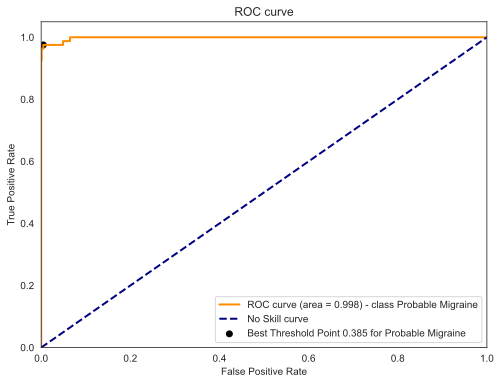

In [159]:
from sklearn.metrics import precision_recall_curve, roc_curve, auc, average_precision_score
from numpy import sqrt
from numpy import argmax
import matplotlib.pyplot as plt
#%matplotlib inline

#####################################################################
# Function to get the prediction array y for each class:
# Input:  yTestArray [[NMigraine=0],[PMigraine=1],[Migraine=2]] 
# Output: When index=0 -> y_pred_array [[NMigraine=1],[PMigraine=0],[Migraine=0]]
# Output: When index=1 -> y_pred_array [[NMigraine=0],[PMigraine=1],[Migraine=0]]
# Output: When index=2 -> y_pred_array [[NMigraine=0],[PMigraine=0],[Migraine=1]]
#####################################################################
def GetPredictionMigraineArray(indexPredicted, yTestArray):
    if indexPredicted == 0: #No migraine 0
        y_pred_array = np.where(yTestArray == 0, 3, yTestArray) #when 0 return 3
        y_pred_array = np.where(y_pred_array == 1, 0, y_pred_array) #when 1 return 0
        y_pred_array = np.where(y_pred_array == 2, 0, y_pred_array) #when 2 return 0
        y_pred_array = np.where(y_pred_array == 3, 1, y_pred_array) #when 3 return 1
    elif indexPredicted == 1: #Probable migraine 1
        y_pred_array  = np.where(yTestArray == 2, 0, yTestArray) #remove Migraine values '2', only '1' values
    else : #Migraine 2
        y_pred_array  = np.where(yTestArray == 1, 0, yTestArray) #remove Probable Migraine values '1', only '2' values
        y_pred_array = np.where(y_pred_array == 2, 1, y_pred_array) #pass Migraine values '2' to binary '1'
    return y_pred_array


labels_plot_curve = ['No Migraine', 'Probable Migraine', 'Migraine']


n_classes = 3
thresholdROCOptmNoMigraine = 0.5
thresholdROCOptmProbMigraine = 0.5
thresholdROCOptmMigraine = 0.5

# spliting 20% (test data), 80% (training data) and stratify mode:
# https://scikit-learn.org/stable/modules/cross_validation.html#stratification
# with 'random_state=0' everytime the result will be the same
XTrain, XTest, yTrain, yTest = train_test_split(X.values, y.values.ravel(), test_size = 0.2, 
                                                stratify=y, random_state=0)

# Predict the probabilities for Xtest (20% stratified)
# return matrix with probabilities for -> No migraine 0, Probable Migraine 1 and Migraine 2
y_predict_proba_80_20  = LRegression_Multi_Model.fit(XTrain, yTrain.ravel()).predict_proba(XTest)

#############
# ROC curve
#############
# Compute ROC curve and ROC area for each class
plt.figure(figsize=(8, 6))
lw = 2

for i in range(n_classes):
    #if ( i > 0 ):  # Probable Migraine or Migraine classes
        fpr, tpr, thresholds = roc_curve(GetPredictionMigraineArray(i,yTest), y_predict_proba_80_20[:, i])
        roc_auc = auc(fpr, tpr)
        ##########################################################################
        # Extrapolating a multiclass example from [12] (Brownlee, 2020). 
        # Apply the J Youden statistic method to calculate the optimal umbral
        # https://en.wikipedia.org/wiki/Youden%27s_J_statistic
        ##########################################################################
        J = tpr - fpr
        ix = argmax(J)
        if i==0:
            thresholdROCOptmNoMigraine = thresholds[ix]
        if i==1:
            thresholdROCOptmProbMigraine = thresholds[ix]
        if i==2:
            thresholdROCOptmMigraine = thresholds[ix]
        print('ROC -> Best Threshold {} Class = {:.3f}'.format(labels_plot_curve[i], thresholds[ix]))
        if i==1: # Plot Probable Migraine
            # ROC - Probable Migraine
            plt.plot(fpr, tpr, color='darkorange',
                     lw=lw, label='ROC curve (area = {}) - class {}'.format(round(roc_auc,3), labels_plot_curve[i]))
            plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', 
                        label='Best Threshold Point {:.3f} for {}'.format(thresholds[ix] , labels_plot_curve[i]))

# No Skill line
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--', label='No Skill curve')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

##### Métricas obtenidas mediante los umbrales calculados por las curvas ROC.

In [160]:
# Getting the metrics with thresholds calculated from ROC curves:
# thresholdROCOptmNoMigraine = 0.673
yNoMigrainePredictThresholdROCOpt = (y_predict_proba_80_20[:, 0] >= thresholdROCOptmNoMigraine).astype(int)
# thresholdROCOptmProbMigraine = 0.385
yProbableMigrainePredictThresholdROCOpt = (y_predict_proba_80_20[:, 1] >= thresholdROCOptmProbMigraine).astype(int)
# thresholdROCOptmMigraine = 0.454
yMigrainePredictThresholdROCOpt = (y_predict_proba_80_20[:, 2] >= thresholdROCOptmMigraine).astype(int)


print("Metric score format:                               [NMig%   PMig%   Mig%]")
# Precision for optimal threshold from ROC curves
print('Precision with threshold optimized from ROC curve: [{0:2.2%} {1:2.2%} {2:2.2%}]'
      .format(round(precision_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdROCOpt),4),
            round(precision_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdROCOpt),4),
            round(precision_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdROCOpt),4)))
# Recall for optimal threshold from ROC curves
print('Recall with threshold optimized from ROC curve:    [{0:2.2%} {1:2.2%} {2:2.2%}]'
      .format(round(recall_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdROCOpt),4),
            round(recall_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdROCOpt),4),
            round(recall_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdROCOpt),4)))
# F-score for optimal threshold from ROC curves
print('F1 score with threshold optimized from ROC curve:  [{0:2.2%} {1:2.2%} {2:2.2%}]'
      .format(round(f1_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdROCOpt),4),
            round(f1_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdROCOpt),4),
            round(f1_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdROCOpt),4)))

Metric score format:                               [NMig%   PMig%   Mig%]
Precision with threshold optimized from ROC curve: [100.00% 95.18% 94.64%]
Recall with threshold optimized from ROC curve:    [99.74% 97.53% 100.00%]
F1 score with threshold optimized from ROC curve:  [99.87% 96.34% 97.25%]


Los umbrales y métricas obtenidas por medio de las curvas ROC son los siguientes:


| Metric     |  No Migraine | Probable Migraine | Migraine  |
| :-         | :-           | :-                | :-        |
| Precision  | 100%         | 95.2%             | 94.6%     |
| Recall     | 99.7%        | 97.5%             | 100%     |
| F1         | 99.9%        | 96.3%             | 97.2%     |
|            | Umbral ROC   |Umbral ROC         |Umbral ROC |
|            | **0.673**    |**0.385**          |**0.454**     |


#### 2.4.2.2 Utilizar la curva de ***Recuperacion de Precisión***.   
En *datasets* desbalanceados como es este caso, una curva interesante que permite evaluar la eficacia del modelo elegido es la curva ***PRECISION-RECALL***, la cual muestra una serie de ventajas sobre la habitual curva ***ROC*** con su área inferior ***AUC***, ya que la curva ***PRECISION-RECALL*** está más enfocada y es más hábil para informar sobre el rendimiento de modelos predictivos para *datasets* desbalanceados como indica <a id="ref_10"/>[[10] (Saito & Rehmsmeier, 2015)](#ref10). Es decir es más adecuado para optimizar las clases minoritarias buscadas, en este caso ***Probable Migraine*** y ***Migraine***.  
El procedimiento consiste en ir calculando tanto la precision como la recuperación para un conjunto de umbrales para obtener un gráfico donde los umbrales van creciendo con la ***recuperación (recall)*** en el eje X y la ***precisión (precision)*** en el eje Y.  
* Donde la ***precisión*** corresponde a la relación:
                    Precision = TPositive / (TPositive + FPositive)
                    
* Donde la ***recuperación*** corresponde a la relación:
                    Recall = TPositive / (TPositive + FNegative)               
                    
* La relación entre ambas se logra por medio de la métrica ***F1 score*** correspondiente a la media armónica de ambas según la siguiente ecuación:  
                    F1 = 2 * (Precision * Recall) / (Precision + Recall)   

Con esta relación de media armónica lo que se busca es penalizar de manera drástica el valor de F1 cuando alguno de los 2 parámetros (precisión/recuperación) es bajo.             

**NOTA**: Las curva de recuperación de precisión ha sido adaptada a este *dataset* multiclases de los ejemplos siguientes:  
https://stackoverflow.com/questions/56090541/how-to-plot-precision-and-recall-of-multiclass-classifier  
https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/



Precision Recall -> Best Threshold No Migraine Class = 0.499, F-Score = 99.94%
Precision Recall -> Best Threshold Probable Migraine Class = 0.520, F-Score = 97.50%
Precision Recall -> Best Threshold Migraine Class = 0.453, F-Score = 97.25%


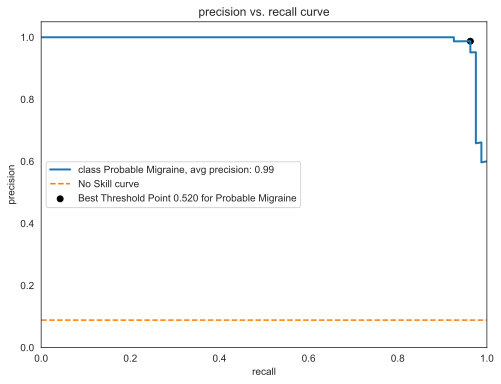

In [315]:
from sklearn.metrics import precision_recall_curve, roc_curve, auc, average_precision_score
from numpy import sqrt
from numpy import argmax
import matplotlib.pyplot as plt
import math
#%matplotlib inline

# Extracted from https://kodify.net/python/math/round-decimals/
def round_decimals_down(number:float, decimals:int=2):
    """
    Returns a value rounded down to a specific number of decimal places.
    """
    if not isinstance(decimals, int):
        raise TypeError("decimal places must be an integer")
    elif decimals < 0:
        raise ValueError("decimal places has to be 0 or more")
    elif decimals == 0:
        return math.floor(number)

    factor = 10 ** decimals
    return math.floor(number * factor) / factor

# Extracted from https://stackoverflow.com/questions/29246455/python-setting-decimal-place-range-without-rounding
def truncate(f, n):
    return math.floor(f * 10 ** n) / 10 ** n

labels_plot_curve = ['No Migraine', 'Probable Migraine', 'Migraine']


n_classes = 3
thresholdPrecRecallOptmNoMigraine = 0.5
thresholdPrecRecallOptmProbMigraine = 0.5
thresholdPrecRecallOptmMigraine = 0.5


# spliting 20% (test data), 80% (training data) and stratify mode:
# https://scikit-learn.org/stable/modules/cross_validation.html#stratification
# with 'random_state=0' everytime the result will be the same
XTrain, XTest, yTrain, yTest = train_test_split(X.values, y.values.ravel(), test_size = 0.2, 
                                                stratify=y, random_state=0)

# Predict the probabilities when the 'dataset' is splitted 20/80 (stratify)
# return matrix with probabilities for -> No migraine 0, Probable Migraine 1 and Migraine 2
y_predict_proba_80_20  = LRegression_Multi_Model.fit(XTrain, yTrain.ravel()).predict_proba(XTest)


###########################
# Precision recall curve
###########################
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    #if (i > 0):  # Probable Migraine or Migraine classes
        precision, recall, thresholds = precision_recall_curve(GetPredictionMigraineArray(i, yTest),
                                                                    y_predict_proba_80_20[:, i])
        average_precision = average_precision_score(GetPredictionMigraineArray(i, yTest), 
                                                                    y_predict_proba_80_20[:, i])
        # convert to f score
        fscore = (2 * precision * recall) / (precision + recall)
        # locate the index of the largest f score
        ix = argmax(fscore)
        if (i==0): # No Migraine
            thresholdPrecRecallOptmNoMigraine = round_decimals_down(thresholds[ix], 4)
            print('Precision Recall -> Best Threshold {} Class = {:.3f}, F-Score = {:2.2%}'
              .format(labels_plot_curve[i], truncate(thresholdPrecRecallOptmNoMigraine,3), fscore[ix]))
#             plt.plot(recall, precision, lw=2, label='class {}, avg precision: {}'
#                      .format(labels_plot_curve[i],round(average_precision,3)))
#             plt.scatter(recall[ix], precision[ix], marker='o', color='black', 
#                    label='Best Threshold Point {:.3f} for {}'.format(truncate(thresholdPrecRecallOptmNoMigraine,3), 
#                                                                           labels_plot_curve[i]))
#              # No Skill line
#             yTestClass = GetPredictionMigraineArray(i,yTest)
#             no_skill = len(yTestClass[yTestClass==0]) / len(yTest)
#             plt.plot([0,1], [no_skill,no_skill], linestyle='--', label='No Skill curve')
        if i==1: # Probable Migraine
            thresholdPrecRecallOptmProbMigraine = round_decimals_down(thresholds[ix], 4)
            print('Precision Recall -> Best Threshold {} Class = {:.3f}, F-Score = {:2.2%}'
              .format(labels_plot_curve[i], truncate(thresholdPrecRecallOptmProbMigraine,3), fscore[ix]))
            plt.plot(recall, precision, lw=2, label='class {}, avg precision: {}'
                     .format(labels_plot_curve[i],round(average_precision,3)))
            plt.scatter(recall[ix], precision[ix], marker='o', color='black', 
                label='Best Threshold Point {:.3f} for {}'.format(truncate(thresholdPrecRecallOptmProbMigraine,3),
                                                                      labels_plot_curve[i]))
             # No Skill line
            yTestClass = GetPredictionMigraineArray(i,yTest)
            no_skill = len(yTestClass[yTestClass==1]) / len(yTest)
            plt.plot([0,1], [no_skill,no_skill], linestyle='--', label='No Skill curve')
        if (i==2): # Migraine
            thresholdPrecRecallOptmMigraine = round_decimals_down(thresholds[ix], 4)
            print('Precision Recall -> Best Threshold {} Class = {:.3f}, F-Score = {:2.2%}'
              .format(labels_plot_curve[i], truncate(thresholdPrecRecallOptmMigraine,3), fscore[ix]))
#             plt.plot(recall, precision, lw=2, label='class {}, avg precision: {}'
#                      .format(labels_plot_curve[i],round(average_precision,3)))
#             plt.scatter(recall[ix], precision[ix], marker='o', color='black', 
#                      label='Best Threshold Point {:.3f} for {}'.format(truncate(thresholdPrecRecallOptmMigraine,3), 
#                                                                           labels_plot_curve[i]))
#              # No Skill line
#             yTestClass = GetPredictionMigraineArray(i,yTest)
#             no_skill = len(yTestClass[yTestClass==2]) / len(yTest)
#             plt.plot([0,1], [no_skill,no_skill], linestyle='--', label='No Skill curve')

plt.xlabel("recall")
plt.ylabel("precision")
plt.legend(loc="best")
plt.title("precision vs. recall curve")
plt.ylim([0, 1.05])
plt.xlim([0, 1])
plt.show()

##### Métricas obtenidas mediante los umbrales calculados por las curvas de recuperación de precisión.

In [318]:
# Getting the metrics with thresholds calculated from Precision/Recall curves:
# thresholdROCOptmNoMigraine = 0.499
yNoMigrainePredictThresholdPrecRecallOpt = (y_predict_proba_80_20[:, 0] >= 
                                                                thresholdPrecRecallOptmNoMigraine).astype(int)
# thresholdROCOptmProbMigraine = 0.520
yProbableMigrainePredictThresholdPrecRecallOpt = (y_predict_proba_80_20[:, 1] >= 
                                                                thresholdPrecRecallOptmProbMigraine).astype(int)
# thresholdROCOptmMigraine = 0.453
yMigrainePredictThresholdPrecRecallOpt = (y_predict_proba_80_20[:, 2] >= 
                                                                thresholdPrecRecallOptmMigraine).astype(int)

print("Metric score format:                                            [NMig%   PMig%   Mig%]")
# Precision for optimal threshold from Precision/Recall curves
print('Precision with threshold optimized from Precision/Recall curve: [{0:2.2%} {1:2.2%} {2:2.2%}]'
    .format(round(precision_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdPrecRecallOpt),4),
    round(precision_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdPrecRecallOpt),4),
    round(precision_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdPrecRecallOpt),4)))
# Recall for optimal threshold from Precision/Recall curves
print('Recall with threshold optimized from Precision/Recall curve:    [{0:2.2%} {1:2.2%} {2:2.2%}]'
    .format(round(recall_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdPrecRecallOpt),4),
    round(recall_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdPrecRecallOpt),4),
    round(recall_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdPrecRecallOpt),4)))
# F-score for optimal threshold from Precision/Recall curves
print('F1 score with threshold optimized from Precision/Recall curve:  [{0:2.2%} {1:2.2%} {2:2.2%}]'
    .format(round(f1_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdPrecRecallOpt),4),
    round(f1_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdPrecRecallOpt),4),
    round(f1_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdPrecRecallOpt),4)))

Metric score format:                                            [NMig%   PMig%   Mig%]
Precision with threshold optimized from Precision/Recall curve: [99.87% 98.73% 94.64%]
Recall with threshold optimized from Precision/Recall curve:    [100.00% 96.30% 100.00%]
F1 score with threshold optimized from Precision/Recall curve:  [99.94% 97.50% 97.25%]


Los umbrales y métricas obtenidas por medio de la curvas de recuperación de precisión son los siguientes:


| Metric     |  No Migraine | Probable Migraine | Migraine  |
| :-         | :-           | :-                | :-        |
| Precision  | 99.87%        | 98.73%             | 94.64%     |
| Recall     | 100%         | 96.3%             | 100%      |
| F1         | 99.94%        | 97.5%             | 97.25%     |
|            | Umbral PR    |Umbral PR          |Umbral PR  |
|            | **0.499**    |**0.520**          |**0.453**     |


#### 2.4.2.3 Método ***genérico*** para obtener el ajuste óptimo del umbral para mejorar la métrica ***F1 score***.  
El método genérico utilizado a continuación <u>para el ajuste óptimo del umbral con el objetivo de mejorar la ***F1***</u> es adecuado cuando el número de datos no es muy elevado como es este caso ya que su rendimiento con un gran número de datos disminuye.

In [326]:
import math
import matplotlib.pyplot as plt


####################################################################################################################
# Threshold tuning functions
# Adapted from: Aprilliant, A. (2021, enero 1). Optimal Threshold for Imbalanced Classification. 
#               Medium. https://towardsdatascience.com/optimal-threshold-for-imbalanced-classification-5884e870c293
####################################################################################################################
def getOptimalThresholdTuning(y_pred, y_test, step_points = 1000, plotting=True, title = 'Threshold Tuning Curve', 
                              className = 'Migraine', precisionRecallThreshold = 0.5):
    thresholds = np.arange(0.0, 1.0, 1/step_points)   # default 1000 steps
    fscore = np.zeros(shape=(len(thresholds)))
    #print('Length of sequence: {}'.format(len(thresholds)))

    # Fit the model
    for index, elem in enumerate(thresholds):
        # Corrected probabilities
        y_pred_prob = (y_pred > elem).astype('int')
        # Calculate the f-score
        fscore[index] = f1_score(y_test, y_pred_prob)

    # Find the optimal threshold
    index = np.argmax(fscore)
    thresholdOpt = round(thresholds[index], ndigits = 4)
    fscoreOpt = round(fscore[index], ndigits = 4)
    print('Class: {} -> Best Optimal Threshold Tuning: {} with F-Score: {:2.2%}'.format(className, thresholdOpt, 
                                                                                        fscoreOpt))
    # Compare optimal threshold with precision recall curve
    indexPrecRecall = math.ceil(step_points * precisionRecallThreshold);
    fscorePrecisionRecall = round(fscore[indexPrecRecall], ndigits = 4)
    print('Class: {} -> Best Precision Recall Curve Threshold: {} with F-Score: {:2.2%}'.format(className, 
                                                                                        precisionRecallThreshold, 
                                                                                        fscorePrecisionRecall))
    
    if plotting:
        df_threshold_tuning = pd.DataFrame({'F-score':fscore, 'Threshold':thresholds})

        # Plot the threshold tuning
        plotnine.options.figure_size = (8, 6)
        (
            print(ggplot(data = df_threshold_tuning) +
                geom_point(aes(x = 'Threshold', y = 'F-score'), color='blue', size=0.35) + 
                geom_point(aes(x = thresholdOpt, y = fscoreOpt), color='#d4616d', size=4) + 
                geom_point(aes(x = precisionRecallThreshold, y = fscorePrecisionRecall), color='orange', size=4) +
                geom_line(aes(x = 'Threshold', y = 'F-score'), color='#53b092') + 
                annotate('text', x = thresholdOpt, y = fscoreOpt, color='#d4616d',
                    label = 'Optimal threshold: {}'.format(thresholdOpt),
                                                            nudge_x = -0.15, 
                                                            nudge_y = +0.05, 
                                                            size = 10, 
                                                            fontstyle = 'normal') +
                annotate('text', x = thresholdOpt, y = fscoreOpt, color='orange',
                    label = 'Precision-Recall threshold: {}'.format(precisionRecallThreshold),
                                                            nudge_x = +0.22, 
                                                            nudge_y = +0.05, 
                                                            size = 10, 
                                                            fontstyle = 'normal') +
                  labs(title = title) + 
                  xlab('Threshold') + 
                  ylab('F-score') + 
                  coord_cartesian(ylim = (0.5, 1.1)) +
                  theme_minimal())
            
            #thresholdPlot.save('./DMS_imgs/BestThresholdKFoldPlot_ProbableMigraine.pdf', height=4, width=6)  
            #print(thresholdPlot)
        )
    
    return thresholdOpt


###########################
# Optimal Threshold Tuning
###########################

# Variables for metrics average values

classNames = ['No Migraine', 'Probable Migraine', 'Migraine']
thresholdOptmTuningNoMigraine = 0.5
thresholdOptmTuningProbMigraine = 0.5
thresholdOptmTuningMigraine = 0.5


# spliting 20% (test data), 80% (training data) and stratify mode:
# https://scikit-learn.org/stable/modules/cross_validation.html#stratification
# with 'random_state=0' everytime the result will be the same
XTrain, XTest, yTrain, yTest = train_test_split(X.values, y.values.ravel(), test_size = 0.2, 
                                                stratify=y, random_state=0)

# Predict the probabilities when the 'dataset' is splitted 20/80 (stratify)
# return matrix with probabilities for -> No migraine 0, Probable Migraine 1 and Migraine 2
y_predict_proba_80_20  = LRegression_Multi_Model.fit(XTrain, yTrain.ravel()).predict_proba(XTest)


# Threshold tuning function for no migraine class

thresholdOptmTuningNoMigraine = getOptimalThresholdTuning(y_predict_proba_80_20[:, 0],
                                        GetPredictionMigraineArray(0,yTest),
                                        plotting=True,
                                        title = 'Threshold Tuning Curve - No Migraine',
                                        className = classNames[0], 
                                        precisionRecallThreshold = truncate(thresholdPrecRecallOptmNoMigraine, 3))
#print('Best Tuning Threshold - Probable Migraine: {}'.format(round(thresholdOptmTuningNoMigraine, 3)))


Class: No Migraine -> Best Optimal Threshold Tuning: 0.414 with F-Score: 99.94%
Class: No Migraine -> Best Precision Recall Curve Threshold: 0.499 with F-Score: 99.94%


In [327]:
# Threshold tuning function for probable migraine class

thresholdOptmTuningProbMigraine = getOptimalThresholdTuning(y_predict_proba_80_20[:, 1],
                                        GetPredictionMigraineArray(1,yTest),
                                        plotting=True,
                                        title = 'Threshold Tuning Curve - Probable Migraine',
                                        className = classNames[1], 
                                        precisionRecallThreshold = truncate(thresholdPrecRecallOptmProbMigraine, 3))
#print('Best Tuning Threshold - Probable Migraine: {}'.format(round(thresholdOptmTuningProbMigraine, 3)))

Class: Probable Migraine -> Best Optimal Threshold Tuning: 0.513 with F-Score: 97.50%
Class: Probable Migraine -> Best Precision Recall Curve Threshold: 0.52 with F-Score: 97.50%


In [328]:
# Threshold tuning function for migraine class
thresholdOptmTuningMigraine = getOptimalThresholdTuning(y_predict_proba_80_20[:, 2],
                                        GetPredictionMigraineArray(2,yTest),
                                        plotting=True,
                                        title = 'Threshold Tuning Curve - Migraine',
                                        className = classNames[2], 
                                        precisionRecallThreshold = truncate(thresholdPrecRecallOptmMigraine, 3))
#print('Best Tuning Threshold - Migraine: {}'.format(round(thresholdOptmTuningMigraine, 3)))

Class: Migraine -> Best Optimal Threshold Tuning: 0.331 with F-Score: 97.25%
Class: Migraine -> Best Precision Recall Curve Threshold: 0.453 with F-Score: 97.25%


##### Métricas obtenidas mediante los umbrales calculados por el método del ajuste óptimo del umbral.

In [329]:
# Getting the metrics with thresholds calculated from optimized threshold tuning method:
# thresholdOptmTuningNoMigraine = 0.414
yNoMigrainePredictThresholdTuningOpt = (y_predict_proba_80_20[:, 0] >= 
                                                    thresholdOptmTuningNoMigraine).astype(int)
# thresholdOptmTuningProbMigraine = 0.513
yProbableMigrainePredictThresholdTuningOpt = (y_predict_proba_80_20[:, 1] >= 
                                                    thresholdOptmTuningProbMigraine).astype(int)
# thresholdOptmTuningMigraine = 0.331
yMigrainePredictThresholdTuningOpt = (y_predict_proba_80_20[:, 2] >= 
                                                    thresholdOptmTuningMigraine).astype(int)

print("Metric score format:                                            [NMig%   PMig%   Mig%]")
# Precision for optimal threshold from Precision/Recall curves
print('Precision with threshold optimized from Precision/Recall curve: [{0:2.2%} {1:2.2%} {2:2.2%}]'
    .format(round(precision_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdTuningOpt),4),
    round(precision_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdTuningOpt),4),
    round(precision_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdTuningOpt),4)))
# Recall for optimal threshold from Precision/Recall curves
print('Recall with threshold optimized from Precision/Recall curve:    [{0:2.2%} {1:2.2%} {2:2.2%}]'
    .format(round(recall_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdTuningOpt),4),
    round(recall_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdTuningOpt),4),
    round(recall_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdTuningOpt),4)))
# F-score for optimal threshold from Precision/Recall curves
print('F1 score with threshold optimized from Precision/Recall curve:  [{0:2.2%} {1:2.2%} {2:2.2%}]'
    .format(round(f1_score(GetPredictionMigraineArray(0 , yTest), yNoMigrainePredictThresholdTuningOpt),4),
    round(f1_score(GetPredictionMigraineArray(1 , yTest), yProbableMigrainePredictThresholdTuningOpt),4),
    round(f1_score(GetPredictionMigraineArray(2 , yTest), yMigrainePredictThresholdTuningOpt),4)))

Metric score format:                                            [NMig%   PMig%   Mig%]
Precision with threshold optimized from Precision/Recall curve: [99.87% 98.73% 94.64%]
Recall with threshold optimized from Precision/Recall curve:    [100.00% 96.30% 100.00%]
F1 score with threshold optimized from Precision/Recall curve:  [99.94% 97.50% 97.25%]


Los umbrales y métricas obtenidas por medio del ajuste óptimo del umbral para mejorar la métrica ***F1*** son los siguientes:


| Metric     |  No Migraine | Probable Migraine | Migraine  |
| :-         | :-           | :-                | :-        |
| Precision  | 99.87%        | 98.73%             | 94.64%     |
| Recall     | 100%         | 96.3%             | 100%      |
| F1         | 99.94%        | 97.5%             | 97.25%     |
|            | Umbral Tuning    |Umbral Tuning          |Umbral Tuning  |
|            | **0.414**    |**0.513**          |**0.331**     |

#### 2.4.2.4 Método ***genérico*** para obtener el ajuste óptimo del umbral para mejorar la precisión ***accuracy*** [ELEGIDO].  
El método genérico utilizado a continuación <u>para el ajuste óptimo del umbral con el objetivo de mejorar la ***accuracy***</u> es adecuado cuando el número de datos no es muy elevado como es este caso ya que permite recorrer con un paso muy fino (0.001) todos los umbrales posibles desde 0 a 1 hasta obtener los umbrales óptimos que permiten aumentar al máximo la precisión del modelo.  
Hay que recordar que para evitar el ***overfitting*** y teniendo en cuenta que la métrica decidida a mejorar en el modelo de regresión elegido para este trabajo, es la precisión ***accuracy***, hay que realizar otro bucle anidado con diferentes fracciones ***Kfolds*** (en este caso 16) con datos de entrenamiento y datos de test que permitan garantizar que el modelo se ajusta sobre datos nuevos cada vez. Por lo tanto, en cada iteración del umbral (0->1000) se ejecutan 16 iteraciones de las diferentes fracciones de datos de entrenamiento y test distribuidas, obteniendo la precisión para cada una de las clases minoritarias buscadas, para finalmente obtener un promedio de la misma.  
El siguiente método, ha sido diseñado específicamente en este trabajo para obtener los umbrales óptimos tanto para la clase *Probable Migraine* como la clase *Migraine* funciona según el siguiente diagrama:  
**Figura 2**. *Diagrama de flujo del algoritmo para obtener los umbrales con máxima precisión para las clases 'Probable Migraine' y 'Migraine'.*  
<img src="./DMS_imgs/FlowChart-Algorithm-LogisticRegrModel-OptAccuracyThresholdsClasses.svg?sanitize=true" alt="Figura 2" style="zoom:100%;" />
Después de unos minutos dependiendo de la computadora utilizada se obtiene que para este dataset tenemos los siguientes umbrales óptimos:  
* Probable Migraine -> Best Optimal Accuracy: **99.34%** with Threshold: (**0.546**)
* Migraine -> Best Optimal Accuracy: **99.72%** with Threshold: (**0.427**)

In [333]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
# Accuracy classification score.
from sklearn.metrics import accuracy_score

classNames = ['No Migraine', 'Probable Migraine', 'Migraine']

number_splits = 16
# Provides train/test indices to split data in train/test sets, num splits = 8
#kf = KFold(n_splits=number_splits, shuffle=True, random_state = 0) 
# StratifiedKFold object is a variation of KFold that returns stratified folds. 
# The folds are made by preserving the percentage of samples for each class.
skf = StratifiedKFold(n_splits=number_splits, shuffle=True, random_state = 0)
skf.get_n_splits(X, y)

# Variables for metrics average values
accuracy_avg_threshold_PMigraine = 0
accuracy_avg_threshold_Migraine = 0

step_points = 1000
thresholds = np.arange(0.0, 1.0, 1/step_points)   # default 100 steps, thresholds 0, 0.01...0.99, 1.00
accuracy_score_array_PMigraine = np.zeros(shape=(len(thresholds)))
accuracy_score_array_Migraine = np.zeros(shape=(len(thresholds)))

for index, elem in enumerate(thresholds):   # index 0->1000, elem 0.0, 0.001 -> 0.999, 1.00
    accuracy_avg_threshold_PMigraine = 0
    accuracy_avg_threshold_Migraine = 0
    for train_index, test_index in skf.split(X, y):
        XTrain, XTest = X.iloc[train_index], X.iloc[test_index]
        yTrain, yTest = y.iloc[train_index], y.iloc[test_index]
        yMigrainePredictProbaKFold = LRegression_Multi_Model.fit(XTrain, yTrain.values.ravel()).predict_proba(XTest)
        ###############################################
        # Predicted array as a function of threshold 
        # for 'Probable Migraine' class 
        ###############################################
        #yPredictedProbMigraineWithThreshold = (yMigrainePredictProbaKFold[:,1] > elem).astype('int')
        yPredictedProbMigraineWithThreshold = (yMigrainePredictProbaKFold[:,1] > elem).astype('int')
        # Predicted array as a function of threshold for Migraine class 
        #yPredictedMigraineWithThreshold = (yMigrainePredictProbaKFold[:,2] > elem).astype('int')

        # Accuracy function for the current fold data and current threshold
        var_accuracy_score_threshold = accuracy_score(GetPredictionMigraineArray(1, yTest), 
                                                            yPredictedProbMigraineWithThreshold)
        # Alternative method to compare 2 arrays and return the accuracy, extracted from:
        # https://stackoverflow.com/questions/38877301/how-to-calculate-accuracy-based-on-two-lists-python
        #var_accuracy_score_threshold = sum(1 for a,b in zip(yPredictedWithThreshold, yTest.values.ravel()) if a == b)
        #                                                        / len(yPredictedWithThreshold)
        accuracy_avg_threshold_PMigraine = accuracy_avg_threshold_PMigraine + var_accuracy_score_threshold
        ###############################################
        # Predicted array as a function of threshold 
        # for 'Migraine' class 
        ###############################################
        yPredictedMigraineWithThreshold = (yMigrainePredictProbaKFold[:,2] > elem).astype('int')

        # Accuracy function for the current fold data and current threshold
        var_accuracy_score_threshold = accuracy_score(GetPredictionMigraineArray(2, yTest), 
                                                              yPredictedMigraineWithThreshold)
        accuracy_avg_threshold_Migraine = accuracy_avg_threshold_Migraine + var_accuracy_score_threshold
        ######################################
        # End of internal loop -> Kfolds
        ######################################

    # accuracy metric average
    accuracy_avg_threshold_PMigraine = accuracy_avg_threshold_PMigraine / number_splits
    # save accuracy average in array for 'Probable Migraine' class
    accuracy_score_array_PMigraine[index] = accuracy_avg_threshold_PMigraine
    accuracy_avg_threshold_Migraine = accuracy_avg_threshold_Migraine / number_splits
    # save accuracy average in array for 'Migraine' class
    accuracy_score_array_Migraine[index] = accuracy_avg_threshold_Migraine

    # Accuracy score with specific threshold
    if (elem == 0.5): # default
        print("Accuracy score average for 'Probable Migraine', threshold ({0:.3f}) - {1:0} Splits - Kfold: [{2:2.2%}]"
              .format(elem, number_splits, round(accuracy_avg_threshold_PMigraine, 4)))
        print("Accuracy score average for 'Migraine', threshold ({0:.3f}) - {1:0} Splits - Kfold: [{2:2.2%}]"
              .format(elem, number_splits, round(accuracy_avg_threshold_Migraine, 4)))
    ######################################
    # End of external loop -> Thresholds
    ######################################
    
##################################################
# Find the optimal threshold 'Probable Migraine'
##################################################
indexPMigraineOptimalAccuracy = np.argmax(accuracy_score_array_PMigraine)
thresholdPMigraineOptForAccuracy = round(thresholds[indexPMigraineOptimalAccuracy], ndigits = 4)
accuracyPMigraineThresholdOpt = round(accuracy_score_array_PMigraine[indexPMigraineOptimalAccuracy], ndigits = 4)
print('Class: {0} -> Best Optimal Accuracy: [{1:2.2%}] with Threshold: ({2:.3f})'.format(classNames[1], 
                                                                               accuracyPMigraineThresholdOpt, 
                                                                               thresholdPMigraineOptForAccuracy))

##################################################
# Find the optimal threshold 'Migraine'
##################################################
indexMigraineOptimalAccuracy = np.argmax(accuracy_score_array_Migraine)
thresholdMigraineOptForAccuracy = round(thresholds[indexMigraineOptimalAccuracy], ndigits = 4)
accuracyMigraineThresholdOpt = round(accuracy_score_array_Migraine[indexMigraineOptimalAccuracy], ndigits = 4)
print('Class: {0} -> Best Optimal Accuracy: [{1:2.2%}] with Threshold: ({2:.3f})'.format(classNames[2], 
                                                                               accuracyMigraineThresholdOpt, 
                                                                               thresholdMigraineOptForAccuracy))

Accuracy score average for 'Probable Migraine', threshold (0.500) - 16 Splits - Kfold: [99.19%]
Accuracy score average for 'Migraine', threshold (0.500) - 16 Splits - Kfold: [99.58%]
Class: Probable Migraine -> Best Optimal Accuracy: [99.34%] with Threshold: (0.546)
Class: Migraine -> Best Optimal Accuracy: [99.72%] with Threshold: (0.427)


La siguiente representación gráfica utilizando la librería ***ggplot2*** <a id="ref_18"/>[[18] (Wickham, 2016)](#ref18) permite seguir claramente la evolución de ambas métricas a lo largo de los diferentes thresholds (1000 steps) desde 0 a 1: 

In [334]:
df_accuracy_thresholds = pd.DataFrame({'Accuracy-score-PM':accuracy_score_array_PMigraine, 
                                       'Accuracy-score-M':accuracy_score_array_Migraine, 
                                       'Threshold':thresholds})

# Plot the accuracy optimized thresholds
plotnine.options.figure_size = (8, 6)
(
    print(ggplot(data = df_accuracy_thresholds) +
        # Probable Migrain Plots
        geom_point(aes(x = 'Threshold', y = 'Accuracy-score-PM'), 
                   color='blue', 
                   size=0.35) + 
        geom_line(aes(x = 'Threshold', y = 'Accuracy-score-PM'), 
                  color='blue') + 
        geom_point(aes(x = thresholdPMigraineOptForAccuracy, y = accuracyPMigraineThresholdOpt), 
                   color='blue', 
                   size=4) +
        annotate('text', 
                 x = thresholdPMigraineOptForAccuracy, 
                 y = accuracyPMigraineThresholdOpt, 
                 color='blue',
                 label = 'Optimal threshold: {0}'.format(thresholdPMigraineOptForAccuracy),
                 nudge_x = -0.05, 
                 nudge_y = -0.03, 
                 size = 10, 
                 fontstyle = 'normal') +
        annotate('text', 
                 x = thresholdPMigraineOptForAccuracy, 
                 y = accuracyPMigraineThresholdOpt, 
                 color='blue',
                 label = 'Accuracy: {0:2.2%} Probable Migraine Class'.format(accuracyPMigraineThresholdOpt),
                 nudge_x = -0.05, 
                 nudge_y = -0.04, 
                 size = 10, 
                 fontstyle = 'normal') +
        # Migraine Plots
        geom_point(aes(x = 'Threshold', y = 'Accuracy-score-M'), 
                   color='orange', 
                   size=0.35) + 
        geom_line(aes(x = 'Threshold', y = 'Accuracy-score-M'), 
                  color='orange') + 
        geom_point(aes(x = thresholdMigraineOptForAccuracy, y = accuracyMigraineThresholdOpt), 
                   color='orange', 
                   size=4) +
        annotate('text', 
                 x = thresholdMigraineOptForAccuracy, 
                 y = accuracyMigraineThresholdOpt, 
                 color='orange',
                 label = 'Optimal threshold: {0}'.format(thresholdMigraineOptForAccuracy),
                 nudge_x = -0.1, 
                 nudge_y = +0.025, 
                 size = 10, 
                 fontstyle = 'normal') +
        annotate('text', 
                 x = thresholdMigraineOptForAccuracy, 
                 y = accuracyMigraineThresholdOpt, 
                 color='orange',
                 label = 'Accuracy: {0:2.2%} Migraine Class'.format(accuracyMigraineThresholdOpt),
                 nudge_x = -0.1, 
                 nudge_y = +0.015, 
                 size = 10, 
                 fontstyle = 'normal') +
        labs(title = 'Accuracy Optimized Thresholds') + 
        xlab('Threshold') + 
        ylab('Accuracy-score') + 
        coord_cartesian(ylim = (0.8, 1.05)) +
        theme_minimal())
)

### 2.4.3 Conclusiones de los métodos para optimizar el rendimiento del modelo.  
Después de los métodos para optimizar el rendimiento del modelo de regresión logistica utilizado, se han obtenido las siguientes conclusiones para mejorarlo:  
* <u>Añadir el parámetro **"class_weight='balanced'**</u> para tratar de dar más importancia o peso a las clases minoritarias respecto a la mayoritaria ha quedado descartado por su pérdida de rendimiento en la clase *Probable Migraine* por un excesivo desplazamiento del límite de decisión (*decision boundary*) hacia esta clase respecto a la mayoritaria *No Migraine*.  
* <u>Ajuste del umbral óptimo</u>, con este método de optimización parece posible mejorar el rendimiento del modelo, dependiendo del método utilizado, curvas *ROC*, *Precision/Recall*, *Tuning*, etc se pueden mejorar las diferentes métricas, como:
    * Optimización de la media armónica **F1**, tanto si se utilizan las curvas ***Precision/Recall*** ver 2.4.2.2 donde el umbral obtenido corresponde al máximo del rango donde es óptimo como para el método de ajuste óptimo ***Tuning*** ver 2.4.2.3  donde el umbral obtenido corresponde al mínimo del rango donde es óptimo. Como se puede ver en las gráficas anteriores para la clase *Migraine*, por ejemplo, tenemos un valor óptimo del umbral que va del rango ***0.331*** utilizando ***Tuning*** hasta ***0.453*** si se utilizan las curvas ***Precision/Recall***, en todo ese rango la métrica ***F1*** es máxima de valor ***97.25%***, un valor superior al mejor obtenido ***96.23%*** con el mismo modelo y vector de test (80/20) cuando se usa el umbral por defecto **0.5**. <br></br>A continuación en la tabla siguiente una comparativa de las métricas obtenidas utilizando el umbral optimizado obtenido utilizando ***Tuning*** o ***Precision/Recall*** frente al umbral por defecto **0.5** con idéntico vector de test correspondiente a un ***20%*** del total de datos: <br></br>**Nota:** Tener en cuenta que en este ***notebook*** se han calculado las métricas para una fracción (***split***) de datos de entrenamiento y de test en proporción 80/20 respectivamente para obtener los datos de la tabla siguiente con el objetivo de demostrar como se pueden obtener los umbrales óptimos para mejorar la ***F1***, por lo que si este método hubiera sido elegido para intentar optimizar el threshold habría que distribuir los datos de entrenamiento y de test en un número distribuido de fragmentos ***splits*** mucho mayor a 1 para garantizar que no haya ***overfitting***, como sí que se ha hecho con el siguiente método de optimización del threshold (***16 splits***) para mejorar la precisión ***Accuracy*** del modelo que es el que finalmente ha sido elegido para este trabajo.


| Metric     |  No Migraine | Probable Migraine | Migraine  |
| :-         | :-           | :-                | :-        |
| Precision  | 99.87%        | 95.5%             | 96.23%     |
| Recall     | 100%         | 96.3%             | 96.23%      |
| F1         | 99.94%        | 96.89%             | 96.23%     |
|            | Default Umbral    |Default Umbral          |Default Umbral  |
|            | **0.5**    |**0.5**          |**0.5**     |


| Metric     |  No Migraine | Probable Migraine | Migraine  |
| :-         | :-           | :-                | :-        |
| Precision  | 99.87%        | <font color='darkblue'>98.73%</font>  | <font color='darkred'>94.64%</font>     |
| Recall     | 100%         | 96.3%                                  | <font color='darkblue'>100%</font>      |
| F1         | 99.94%       | <font color='darkblue'>97.5%</font>    | <font color='darkblue'>97.25%</font>     |
|            | Umbral Tuning    |Umbral Tuning          |Umbral Tuning  |
|            | **0.414**    |**0.513**          |**0.331**     |

* 
    * Optimización de la precisión **Accuracy**, es el **método elegido** para optimizar el modelo, el desarrollo del mismo ha sido detallado en el flujo del apartado 2.4.2.4, obteniendo los siguientes umbrales optimizados:
    
| Metric     | Probable Migraine | Migraine  |
| :-         | :-                | :-        |
| Precision  | **99.34%**            | **99.72%**    |
|            | Umbral            | Umbral    |
|            | **0.546**           |**0.427**    |


# 3 Guardar el modelo creado.
Una vez obtenido un modelo de aprendizaje con suficiente rendimiento, como es el caso, donde se han verificado buenos rendimientos en las diferentes métricas como la precisión ***Accuracy***, ***F1 score***, etc para un *dataset* desbalanceado a lo largo de los diferentes fracciones de datos en la validación cruzada, llega el momento del empaquetado y posterior uso del modelo elegido para que pueda ser usado posteriormente, por ejemplo, desde un servidor web.  
La validación cruzada de los datos realizada anteriormente es un procedimiento para estimar el rendimiento de un método para producir un modelo, en este caso regresión logística multinominal, con el objetivo de poder comparar su efectividad con otros modelos llegado el caso, y no para generar el modelo definitivo en sí.  
Por lo tanto, para que los pesos obtenidos sean calculados sobre el mayor número de datos disponibles y habiendo comprobado la efectividad del modelo y optimizado los umbrales para lograr una mayor precisión, se reajusta el mismo mediante el método ***fit*** <u>finalmente con el total de los datos disponibles</u> <a id="ref_16"/>[[16] (Brownlee, 2017)](#ref16), <a id="ref_17"/>[[17] (Bogdanovist, s. f.)](#ref17). <br></br> Para guardarlo se usa la librería de python ***Joblib*** <a id="ref_14"/>[[14] (Joblib Development Team, 2021)](#ref14).

In [335]:
import joblib

# Recalculate the model for all dataset before save it
LRegression_Multi_Model.fit(X, y.values.ravel() )
# returns a matrix of weights (coefficients)
print ("Matrix of weights (Logistic regression multinomial model coefficients):\r\n")
print(LRegression_Multi_Model.coef_)

# Save RL_Model to file in the current working directory
joblib_file = 'ADMTF_LR_Model.pkl'
# Save model as pickle file in the same directory
joblib.dump(LRegression_Multi_Model, joblib_file)

Matrix of weights (Logistic regression multinomial model coefficients):

[[-1.91701452e+00 -2.16310037e+00 -1.83165497e+00 -2.28469308e+00
  -5.64104423e+00 -4.37362270e+00 -5.92449412e+00 -2.77966801e-01
  -2.55758603e-01 -8.92914450e-02 -5.95218466e-01  2.13298765e-01
  -3.34891466e-02 -2.00368207e-01  2.28501143e-01  1.40074345e-02
   1.62231034e-01  1.87898422e-01 -1.17247013e-01 -3.79566384e-01
   1.67867204e-01 -6.16831827e-02  3.14407945e-01  7.07372694e-02
  -1.69584226e-01  9.68507250e-04  2.44079028e-01]
 [ 4.67823413e-01  3.22401463e-01  5.42992903e-01  8.08852319e-01
   1.85090235e-01  2.25608594e-02  4.41891694e-01  1.34423416e-01
   6.78311168e-02 -1.02713703e-01  3.38378832e-01 -3.94458734e-01
   3.24569672e-01 -6.22078282e-02 -1.05290115e-01  9.26386378e-02
  -1.61077786e-01 -3.94728894e-01 -1.17827327e-01  1.48380864e-01
   4.58689637e-02 -2.50016367e-01  3.07082429e-01  2.65952513e-01
  -7.61380298e-02 -1.94015249e-01 -4.26172445e-01]
 [ 1.44919111e+00  1.84069891e+00

['ADMTF_LR_Model.pkl']

# 4 Cargar y verificar efectividad del modelo creado.
Ahora el paso opuesto, es decir, cargar el modelo y utilizarlo para hacer una predicción.

In [254]:
# Load model from file
LRegression_Multi_Model_loaded = joblib.load(joblib_file)

# <u>References</u>
* <a id="ref1"/>[[1]](#ref_1) Park, J.-W., Chu, M. K., Kim, J.-M., Park, S.-G., & Cho, S.-J. (2016). Analysis of Trigger Factors in Episodic Migraineurs Using a Smartphone Headache Diary Applications. PLoS ONE, 11(2). https://doi.org/10.1371/journal.pone.0149577
* <a id="ref2"/>[[2]](#ref_2) Vgontzas, A., & Burch, R. (2018). Episodic Migraine With and Without Aura: Key Differences and Implications for Pathophysiology, Management, and Assessing Risks. *Current Pain and Headache Reports*, *22*(12), 1-8. https://doi.org/10.1007/s11916-018-0735-z  
* <a id="ref3"/>[[3]](#ref_3) Gobel, H. (s. f.). Home. *ICHD-3 The International Classification of Headache Disorders 3rd Edition*. Recuperado 3 de febrero de 2021, de https://ichd-3.org/  
* <a id="ref4"/>[[4]](#ref_4) Marmura, M. J. (2018). Triggers, Protectors, and Predictors in Episodic Migraine. Current Pain and Headache Reports, 22(12), 81. https://doi.org/10.1007/s11916-018-0734-0  
* <a id="ref5"/>[[5]](#ref_5) Kelman, L. (2007). The triggers or precipitants of the acute migraine attack. *Cephalalgia: An International Journal of Headache*, *27*(5), 394-402. https://doi.org/10.1111/j.1468-2982.2007.01303.x  
* <a id="ref6"/>[[6]](#ref_6) Jeff Reback, Wes McKinney, jbrockmendel, Joris Van den Bossche, Tom Augspurger, Phillip Cloud, gfyoung, Simon Hawkins, Sinhrks, Matthew Roeschke, Adam Klein, Terji Petersen, Jeff Tratner, Chang She, William Ayd, Shahar Naveh, Marc Garcia, Jeremy Schendel, Andy Hayden, … Stephan Hoyer. (2021). pandas-dev/pandas: Pandas 1.2.1. Zenodo. https://doi.org/10.5281/zenodo.4452601  
* <a id="ref7"/>[[7]](#ref_7) Harris, C. R., Millman, K. J., van der Walt, S. J., Gommers, R., Virtanen, P., Cournapeau, D., Wieser, E., Taylor, J., Berg, S., Smith, N. J., Kern, R., Picus, M., Hoyer, S., van Kerkwijk, M. H., Brett, M., Haldane, A., del Río, J. F., Wiebe, M., Peterson, P., … Oliphant, T. E. (2020). Array programming with NumPy. Nature, 585(7825), 357-362. https://doi.org/10.1038/s41586-020-2649-2  
* <a id="ref8"/>[[8]](#ref_8) Thomas A Caswell, Michael Droettboom, Antony Lee, John Hunter, Elliott Sales de Andrade, Eric Firing, Tim Hoffmann, Jody Klymak, David Stansby, Nelle Varoquaux, Jens Hedegaard Nielsen, Benjamin Root, Ryan May, Phil Elson, Jouni K. Seppänen, Darren Dale, Jae-Joon Lee, Damon McDougall, Andrew Straw, … Paul Ivanov. (2020). matplotlib/matplotlib: REL: v3.3.2. Zenodo. https://doi.org/10.5281/zenodo.4030140  
* <a id="ref9"/>[[9]](#ref_9) Pedregosa, F., Varoquaux, G., Gramfort, A., Michel, V., Thirion, B., Grisel, O., Blondel, M., Prettenhofer, P., Weiss, R., Dubourg, V., Vanderplas, J., Passos, A., Cournapeau, D., Brucher, M., Perrot, M., & Duchesnay, É. (2011). [Scikit-learn: Machine Learning in Python](https://jmlr.csail.mit.edu/papers/v12/pedregosa11a.html). Journal of Machine Learning Research, 12(85), 2825-2830. 
* <a id="ref10"/>[[10]](#ref_10) Saito, T., & Rehmsmeier, M. (2015). The Precision-Recall Plot Is More Informative than the ROC Plot When Evaluating Binary Classifiers on Imbalanced Datasets. PLoS ONE, 10(3), e0118432. https://doi.org/10.1371/journal.pone.0118432  
* <a id="ref11"/>[[11]](#ref_11) Rocca, B. (2021, febrero 1). Handling imbalanced datasets in machine learning. Medium. https://towardsdatascience.com/handling-imbalanced-datasets-in-machine-learning-7a0e84220f28  
* <a id="ref12"/>[[12]](#ref_12) Brownlee, J. (2020, febrero 9). A Gentle Introduction to Threshold-Moving for Imbalanced Classification. Machine Learning Mastery. https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/  
* <a id="ref13"/>[[13]](#ref_13) Lemaître, G., Nogueira, F., & Aridas, C. K. (2017). Imbalanced-learn: A Python Toolbox to Tackle the Curse of Imbalanced Datasets in Machine Learning. Journal of Machine Learning Research, 18(17), 1-5.
* <a id="ref14"/>[[14]](#ref_14) Joblib Development Team. (2021). Joblib: Running Python functions as pipeline jobs—Joblib 1.1.0.dev0 documentation. https://joblib.readthedocs.io/
* <a id="ref15"/>[[15]](#ref_15) Fluss, R., Faraggi, D., & Reiser, B. (2005). Estimation of the Youden Index and its Associated Cutoff Point. Biometrical Journal, 47(4), 458-472. https://doi.org/10.1002/bimj.200410135
* <a id="ref16"/>[[16]](#ref_16) Brownlee, J. (2017, marzo 16). How to Train a Final Machine Learning Model. Machine Learning Mastery. https://machinelearningmastery.com/train-final-machine-learning-model/
* <a id="ref17"/>[[17]](#ref_17) Bogdanovist. (s. f.). How to choose a predictive model after k-fold cross-validation? https://stats.stackexchange.com/q/52277
* <a id="ref18"/>[[18]](#ref_18) Wickham, H. (2016). ggplot2: Elegant graphics for data analysis. Springer-Verlag New York. https://ggplot2.tidyverse.org

